### Notebook for the processing and exploratory analysis of the [10X Genomics Xenium Breast Cancer](https://www.10xgenomics.com/products/xenium-in-situ/human-breast-dataset-explorer) Rep 2 data. 

- **Developed by**: Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology (WüSI) & Julius-Maximilian-Universität Würzburg**
- **Created**: 230619
- **Last modified**: 230619

### Load required packages

In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import squidpy as sq
import seaborn as sns
import matplotlib.pyplot as plt

### Set up wortking environment 

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 200, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg', fontsize = 8)

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
appnope             0.1.3
asciitree           NA
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cloudpickle         2.2.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
cytoolz             0.12.0
dask                2023.6.0
dask_image          2023.03.0
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
docrep              0.3.2
entrypoints         0.4
executing           1.2.0
fasteners           0.17.3
h5py                3.8.0
hypergeom_ufunc     NA
igraph              0.10.4
imagecodecs         2023.1.23
imageio             2.31.1
importlib_resources NA
ipykernel           6.23.1
ipywidgets          8.0.6
jedi                0.18.2
jinja2              3.1.2
joblib              1.2.0
kiwisolver          1.4.4
lazy_loader         NA
leidenalg           0.9.1
llvmlite            0.38

### Read in Xenium dataset

In [3]:
adata = sc.read_10x_h5(
    filename="../../datasets/xenium/rep_2/outs/cell_feature_matrix.h5"
)
adata

reading ../../datasets/xenium/rep_2/outs/cell_feature_matrix.h5
 (0:00:00)


AnnData object with n_obs × n_vars = 118752 × 313
    var: 'gene_ids', 'feature_types', 'genome'

In [4]:
df = pd.read_csv(
    "../../datasets/xenium/rep_2/outs/cells.csv"
)
df.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area
0,1,479.934467,869.789633,207,0,0,207,166.310469,44.343438
1,2,481.256989,851.689365,147,0,0,147,218.420781,37.253906
2,3,490.647247,855.816202,165,0,0,165,110.723125,42.717813
3,4,491.177719,866.842908,186,0,0,186,181.482969,63.354219
4,5,492.839691,842.511191,82,0,0,82,152.989375,17.204531


In [5]:
df.set_index(adata.obs_names, inplace=True)
adata.obs = df.copy()
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()
adata.obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area
1,1,479.934467,869.789633,207,0,0,207,166.310469,44.343438
2,2,481.256989,851.689365,147,0,0,147,218.420781,37.253906
3,3,490.647247,855.816202,165,0,0,165,110.723125,42.717813
4,4,491.177719,866.842908,186,0,0,186,181.482969,63.354219
5,5,492.839691,842.511191,82,0,0,82,152.989375,17.204531


### Perform basic QC analysis _á la Squidpy_

In [6]:
sc.pp.calculate_qc_metrics(adata, percent_top = (10, 20, 50, 150), inplace = True)

- Calculate percentage of control probes and control codewords

In [7]:
cprobes = (
    adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
cwords = (
    adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")

Negative DNA probe count % : 0.03754676838417094
Negative decoding count % : 0.005942747133908435


- Plot distribution of total transcripts per cell, unique transcripts per cell, area of segmented cells and the ratio of nuclei area to their cells

<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

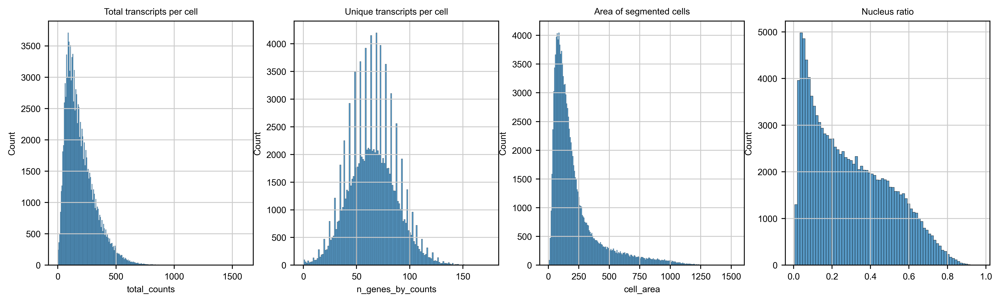

In [8]:
fig, axs = plt.subplots(1, 4, figsize = (15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

### Filter out cells

In [9]:
sc.pp.filter_cells(adata, min_counts = 10)
sc.pp.filter_cells(adata, min_genes = 3)
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 2)
adata

filtered out 382 cells that have less than 10 counts
filtered out 7 cells that have less than 3 genes expressed


AnnData object with n_obs × n_vars = 118363 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells'
    obsm: 'spatial'

### Normalise data and tranform data

In [10]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace = True)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


### Visualise manifold

In [11]:
sc.pp.pca(adata, n_comps = 50, random_state = 1712)
sc.pp.neighbors(adata, n_neighbors = 50, random_state = 1769, method = 'umap')
sc.tl.leiden(adata, resolution = 1.5, random_state = 1786)
sc.tl.umap(adata, min_dist = 0.3, spread = 2, random_state = 1789)

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:55)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:44)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:09)


/Users/cartalop/mambaforge/envs/squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


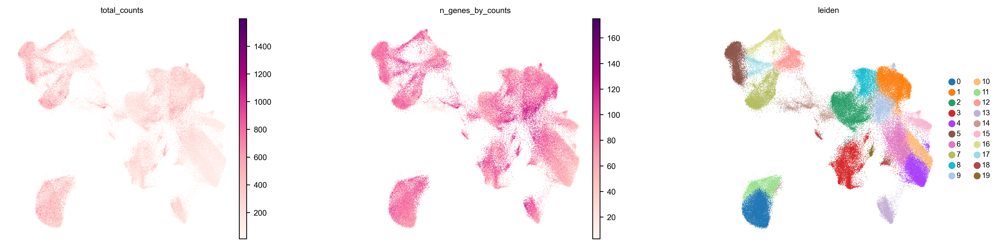

In [12]:
sc.pl.umap(
    adata,
    color = [
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace = 0.4,
    frameon = False, 
    size = 1
)

### Visualise cluster on tissue

/Users/cartalop/mambaforge/envs/squidpy/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


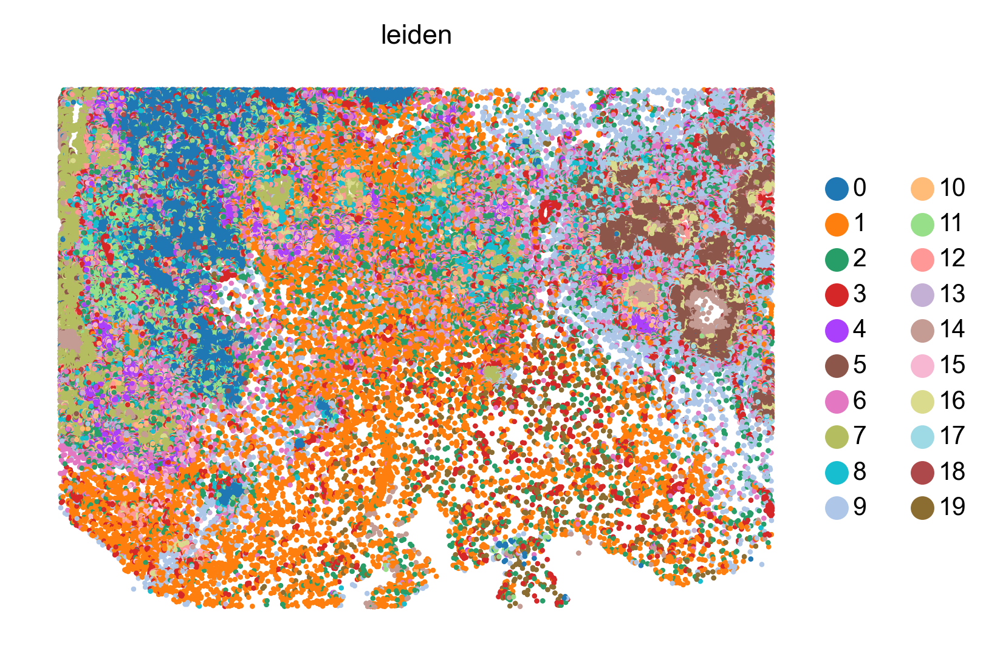

In [13]:
sq.pl.spatial_scatter(
    adata,
    library_id = "spatial",
    shape = None,
    color = [
        "leiden",
    ],
    wspace = 0.4,
    frameon = False
)

### Characterise clusters

In [14]:
sc.tl.rank_genes_groups(adata, 'leiden', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
markers_cells = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
markers_cells.head(5)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,16_l,17_n,17_p,17_l,18_n,18_p,18_l,19_n,19_p,19_l
0,EPCAM,0.0,3.011852,CXCL12,0.0,3.206985,FGL2,0.0,3.528054,CAV1,...,5.027040,CEACAM6,0.0,3.050956,CD8A,0.000000e+00,3.958945,ADH1B,0.000000e+00,6.587944
1,FASN,0.0,3.105536,LUM,0.0,2.787847,FCER1G,0.0,3.047948,PECAM1,...,3.800871,GATA3,0.0,2.309490,CCL5,0.000000e+00,3.217411,LPL,0.000000e+00,5.918412
2,FOXA1,0.0,2.857487,MMP2,0.0,3.116989,LYZ,0.0,3.235340,CD93,...,3.058462,TACSTD2,0.0,2.293967,CD3E,0.000000e+00,2.638366,ADIPOQ,0.000000e+00,7.890346
3,KRT7,0.0,2.756685,CCDC80,0.0,2.934506,CD4,0.0,2.792670,AQP1,...,5.632876,KRT14,0.0,2.796968,PTPRC,5.993936e-227,2.032507,PDK4,1.284957e-292,2.975210
4,SCD,0.0,2.681685,PDGFRA,0.0,3.084487,AIF1,0.0,2.917749,VWF,...,2.383191,MYLK,0.0,2.252105,TRAC,1.145994e-187,1.954455,AKR1C1,1.570148e-282,4.597954


In [15]:
markers_cells.to_csv('BRCA_Xenium_Rep_2_WilcoxRST_top100.csv', sep = ',', index = False)

In [16]:
adata.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19'],
      dtype='object')

/Users/cartalop/mambaforge/envs/squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


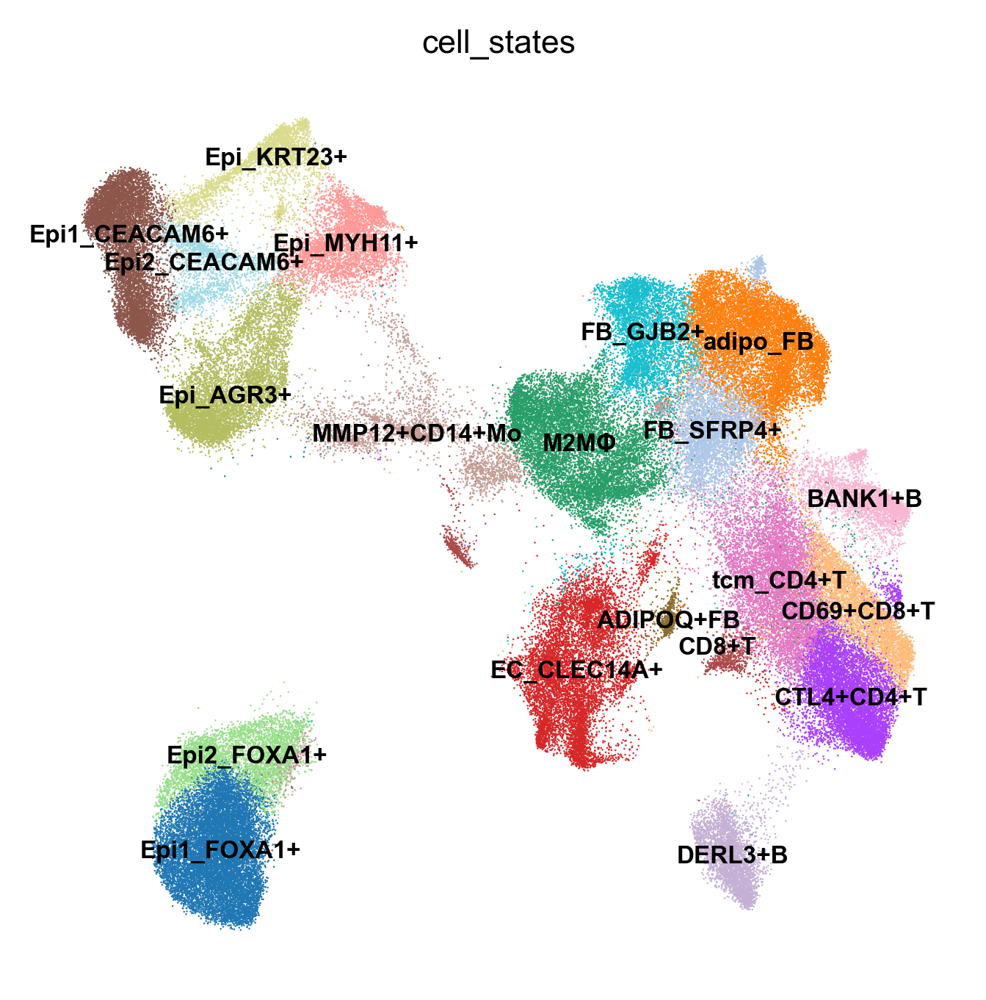

In [32]:
adata.obs['cell_states'] = adata.obs['leiden'].copy()
adata.obs['cell_states'] = adata.obs['cell_states'].cat.rename_categories(['Epi1_FOXA1+', 'adipo_FB', 'M2MΦ', 'EC_CLEC14A+', 'CTL4+CD4+T', 'Epi1_CEACAM6+', 'tcm_CD4+T', 'Epi_AGR3+', 'FB_GJB2+', 'FB_SFRP4+', 'CD69+CD8+T', 'Epi2_FOXA1+', 'Epi_MYH11+',
       'DERL3+B', 'MMP12+CD14+Mo', 'BANK1+B', 'Epi_KRT23+', 'Epi2_CEACAM6+', 'CD8+T', 'ADIPOQ+FB'])
sc.pl.umap(adata, color = ['cell_states'], size = 0.8, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

/Users/cartalop/mambaforge/envs/squidpy/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


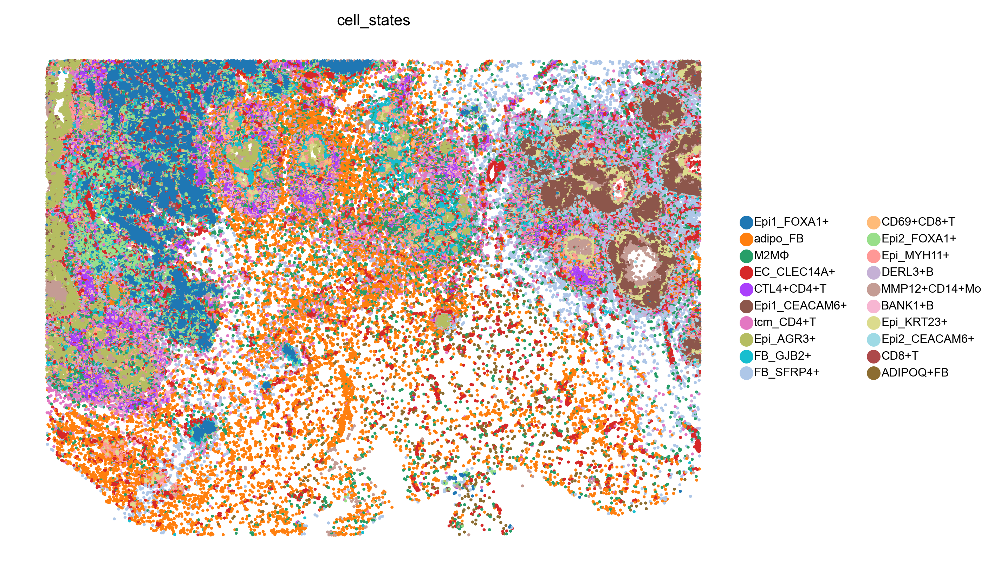

In [33]:
sq.pl.spatial_scatter(
    adata,
    library_id = "spatial",
    shape = None,
    color = [
        "cell_states",
    ],
    wspace = 0.4,
    frameon = False,
    legend_fontsize = 6,
    figsize = (7,7)
)

### Export object

In [34]:
adata

AnnData object with n_obs × n_vars = 118363 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'leiden', 'cell_states'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'cell_states_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [36]:
adata.write('../../datasets/xenium/rep_2/Xenium_FFPE_Human_Breast_Cancer_Rep2_annotated_ctl230619.h5ad')